![Fixel Algorithms](https://fixelalgorithms.co/images/CCExt.png)

# <center> Deep Learning Methods </center>
## <center> Lecture 9 - Tips and Tricks </center>
### <center> Image Augmentations </center>

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/FixelAlgorithmsTeam/FixelCourses/blob/master/DeepLearningMethods/09_TipsAndTricks/MainImageAugmentation.ipynb)

#### This notebook is based on:  
https://pytorch.org/vision/stable/auto_examples/plot_transforms.html

In [1]:
#-- Wide screen:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

In [2]:
#-- Auto reload:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy             as np
import matplotlib.pyplot as plt
import matplotlib

import torch
import torchvision
import torchvision.transforms as transforms

matplotlib.rc('font', **{'size' : 16})

In [4]:
def PlotTransofrm(lImages, title, bAxis=False):
    N     = len(lImages)
    width = 4
    
    lWidth = [lImages[ii].size[0] for ii in range(N)]
    fig, _ = plt.subplots(1, N, figsize=(N*width, 6), gridspec_kw={'width_ratios':lWidth})
    for ii, ax in enumerate(fig.axes):
        ax.imshow   (lImages[ii], cmap='gray')
        ax.set_title(f'{ii}')
        ax.axis('on') if bAxis else ax.axis('off')
        
    
    plt.suptitle(title)

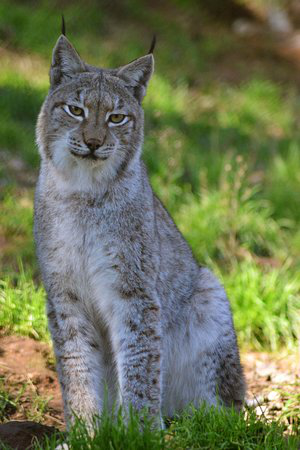

In [5]:
from PIL import Image
oImage = Image.open('./img1.jpg')
oImage

#### Pad
The `Pad` transform fills image borders with some pixel values.

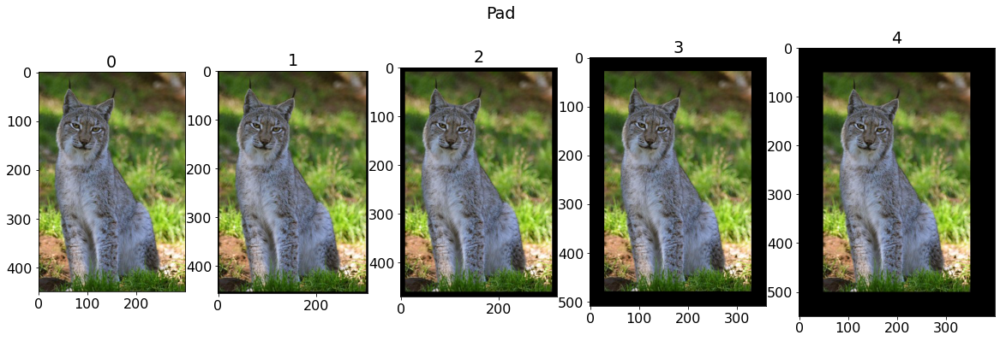

In [6]:
lPad = [oImage] + [transforms.Pad(padding=padding)(oImage) for padding in (3, 10, 30, 50)]
PlotTransofrm(lPad, 'Pad', True)

#### Resize
The `Resize` transform resizes an image.

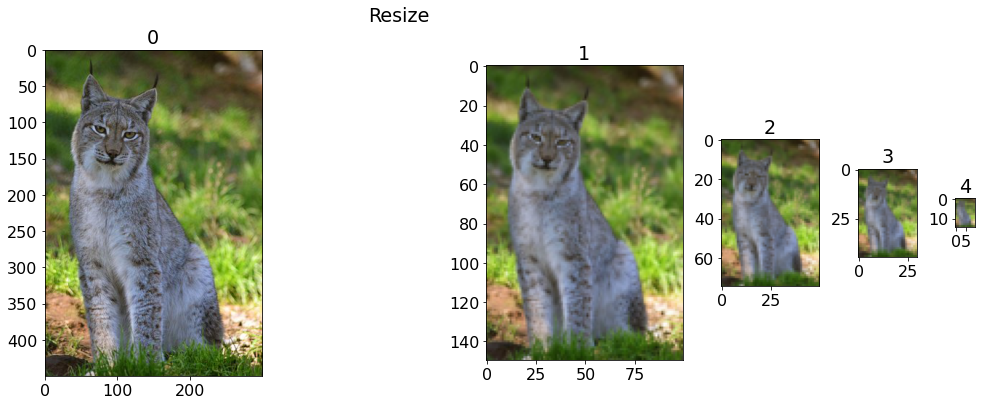

In [7]:
lResize = [oImage] + [transforms.Resize(size=size)(oImage) for size in (100, 50, 30, 10)]
PlotTransofrm(lResize, 'Resize', True)

#### Center crop
The `CenterCrop` transform crops the given image at the center.

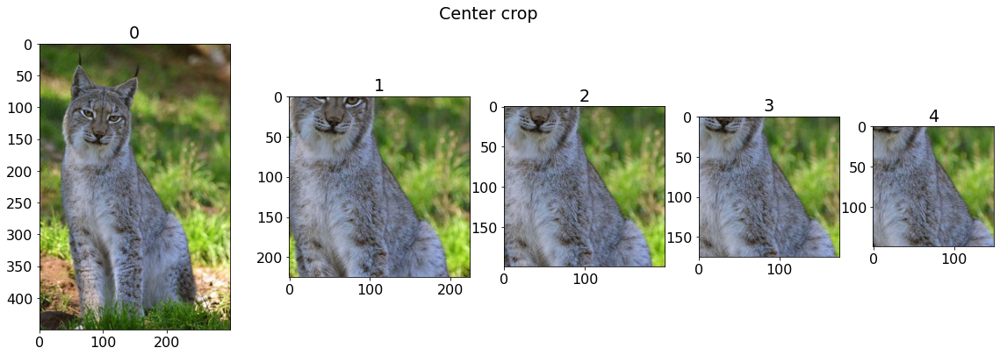

In [8]:
lCenterCrop = [oImage] + [transforms.CenterCrop(size=size)(oImage) for size in (225, 200, 175, 150)]
PlotTransofrm(lCenterCrop, 'Center crop', True)

#### Five crop
The `FiveCrop` transform crops the given image into four corners and the central crop.

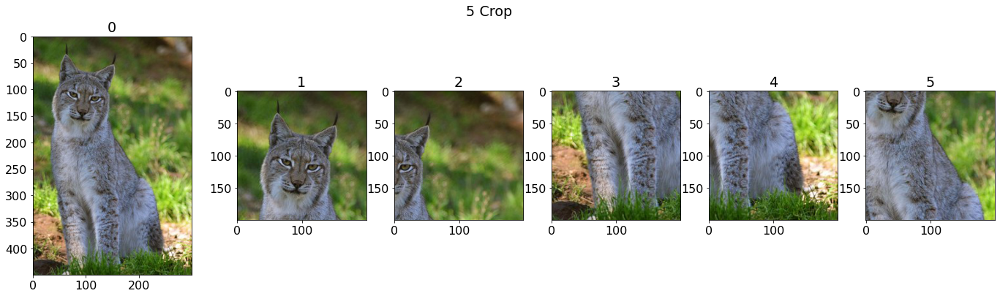

In [9]:
l5Crop = [oImage] + list(transforms.FiveCrop(size=(200, 200))(oImage))
PlotTransofrm(l5Crop, '5 Crop', True)

#### Grayscale
The `Grayscale` transform converts an image to grayscale.

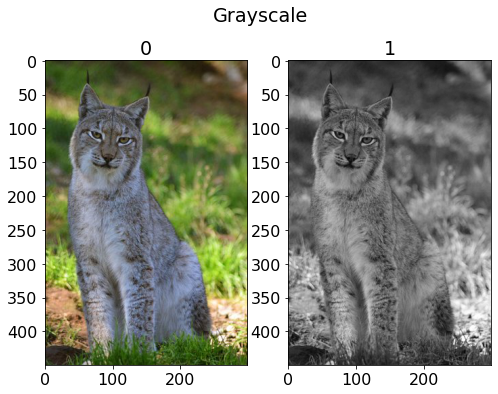

In [11]:
lGray = [oImage] + [transforms.Grayscale()(oImage)]
PlotTransofrm(lGray, 'Grayscale', True)

#### Color Jitter
The `ColorJitter` transform randomly changes the brightness, saturation, and other properties of an image.

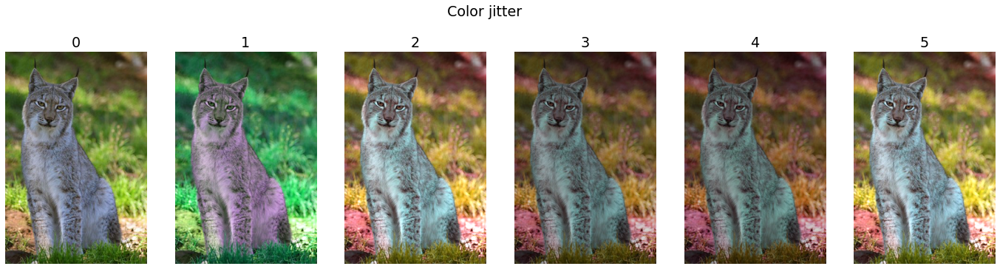

In [12]:
oJitter = transforms.ColorJitter(brightness=.2, hue=.2)
lJiiter = [oImage] + [oJitter(oImage) for _ in range(5)]
PlotTransofrm(lJiiter, 'Color jitter')

#### Gaussian Blur
The `GaussianBlur` transform performs Gaussian blur transform on an image

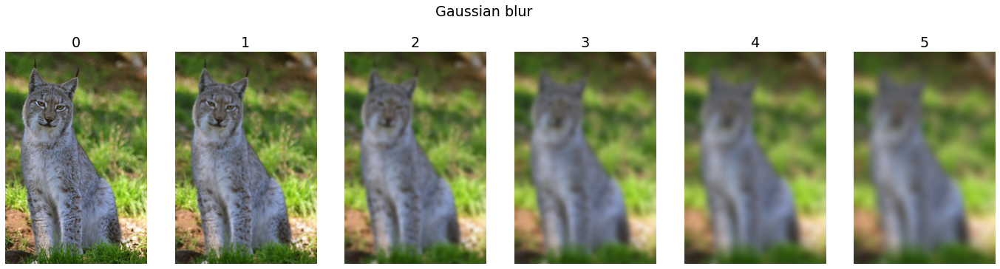

In [13]:
lBLur   = [oImage] + [transforms.GaussianBlur(kernel_size=(31, 31), sigma=(ii))(oImage) for ii in range(1, 11, 2)]
PlotTransofrm(lBLur, 'Gaussian blur')

#### Random perspective
The `RandomPerspective` transform performs random perspective transform on an image.

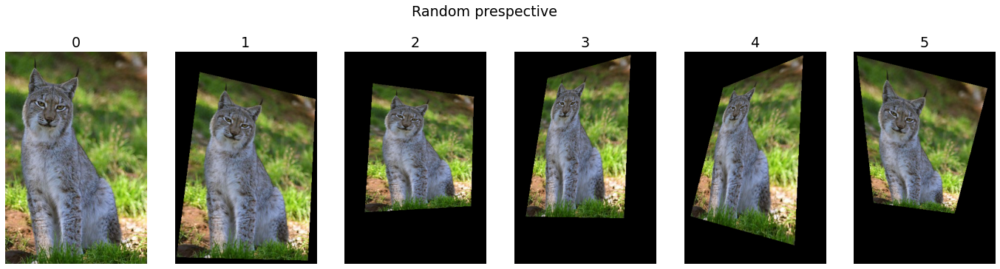

In [15]:
oPrespective = transforms.RandomPerspective(distortion_scale=0.6, p=1.0)
lPrespective = [oImage] + [oPrespective(oImage) for _ in range(5)]
PlotTransofrm(lPrespective, 'Random prespective')

#### Random Rotation 
The `RandomRotation` transform rotates an image with random angle.

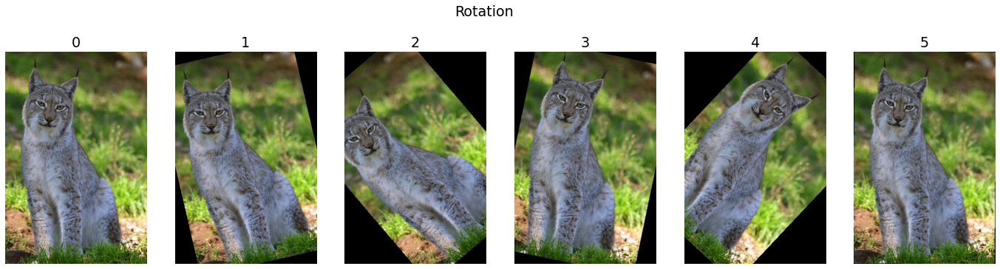

In [16]:
lRotation = [oImage] + [transforms.RandomRotation(degrees=(-45, 45))(oImage) for _ in range(5)]
PlotTransofrm(lRotation, 'Rotation')

#### Random affine
The `RandomAffine` transform performs random affine transform on an image.

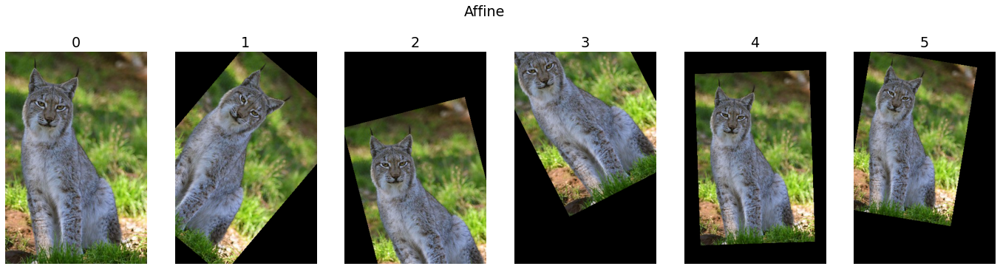

In [17]:
lAffine = [oImage] + [transforms.RandomAffine(degrees=(-45, 45), translate=(0.1, 0.3), scale=(0.75, 0.95))(oImage) for _ in range(5)]
PlotTransofrm(lAffine, 'Affine')

#### Random crop
The `RandomCrop` transform crops an image at a random location.

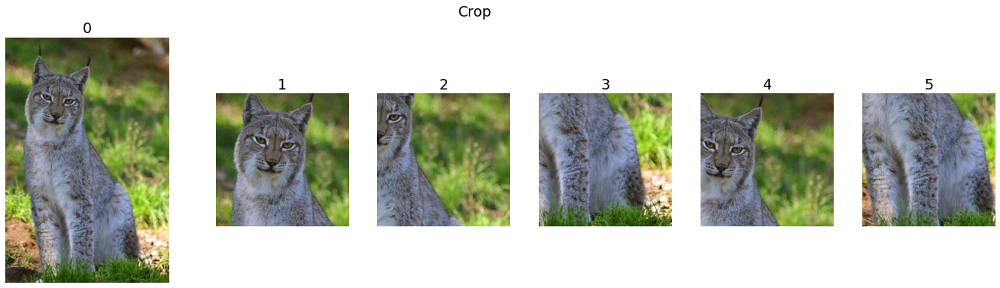

In [18]:
lCrop = [oImage] + [transforms.RandomCrop(size=(200, 200))(oImage) for _ in range(5)]
PlotTransofrm(lCrop, 'Crop')

#### Random crop & resized 
The `RandomResizedCrop` transform crops an image at a random location, and then resizes the crop to a given size.

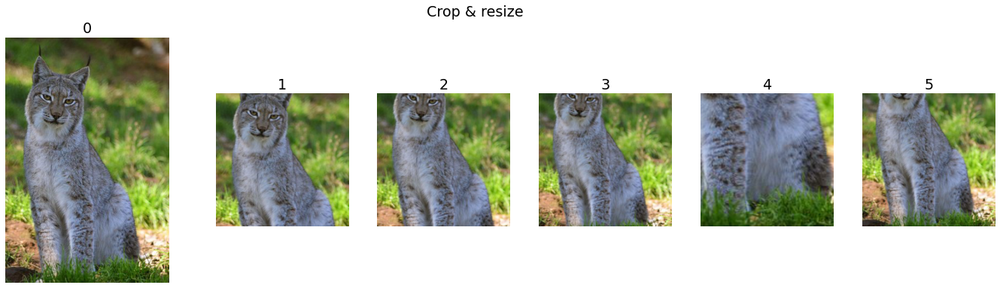

In [19]:
lResizeCrop = [oImage] + [transforms.RandomResizedCrop(size=(200, 200))(oImage) for _ in range(5)]
PlotTransofrm(lResizeCrop, 'Crop & resize')

#### Random invert
The `RandomInvert` transform randomly inverts the colors of the given image.

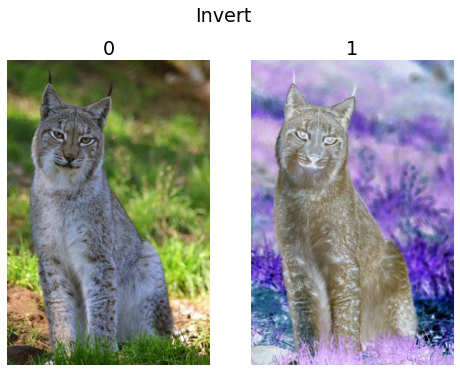

In [20]:
lInvert = [oImage] + [transforms.RandomInvert(p=1)(oImage)]
PlotTransofrm(lInvert, 'Invert')

#### Random posterize
The `RandomPosterize` transform randomly posterizes the image by reducing the number of bits of each color channel.

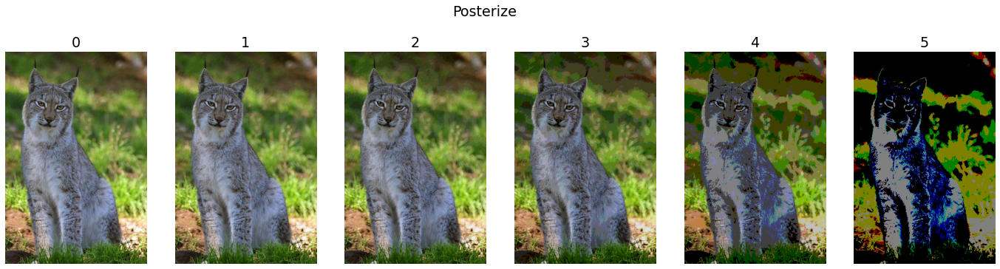

In [21]:
lPosterize = [oImage] + [transforms.RandomPosterize(bits=ii, p=1)(oImage) for ii in reversed(range(1, 6))]
PlotTransofrm(lPosterize, 'Posterize')

#### Random solarize
The `RandomSolarize` transform randomly solarizes the image by inverting all pixel values above the threshold.

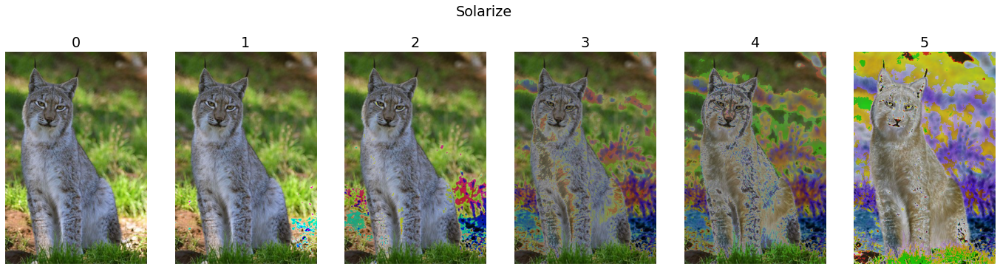

In [22]:
lSolarize = [oImage] + [transforms.RandomSolarize(threshold=ii, p=1)(oImage) for ii in [250, 200, 150, 100, 50]]
PlotTransofrm(lSolarize, 'Solarize')

#### Random adjust sharpness
The `RandomAdjustSharpness` transform randomly adjusts the sharpness of the given image.

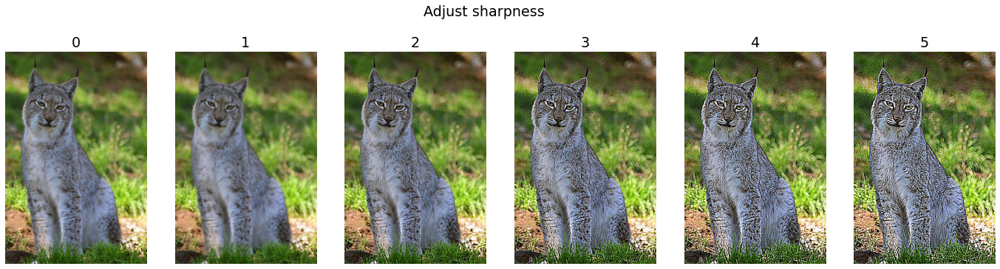

In [23]:
lSharpness = [oImage] + [transforms.RandomAdjustSharpness(sharpness_factor=ii, p=1)(oImage) for ii in range(0, 20, 4)]
PlotTransofrm(lSharpness, 'Adjust sharpness')

#### Random auto-contrast
The `RandomAutocontrast` transform randomly applies autocontrast to the given image.

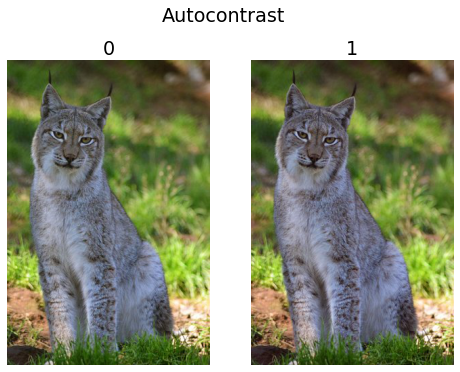

In [24]:
lContrast = [oImage] + [transforms.RandomAutocontrast(p=1)(oImage)]
PlotTransofrm(lContrast, 'Autocontrast')

#### Random equalize
The `RandomEqualize` transform randomly equalizes the histogram of the given image.

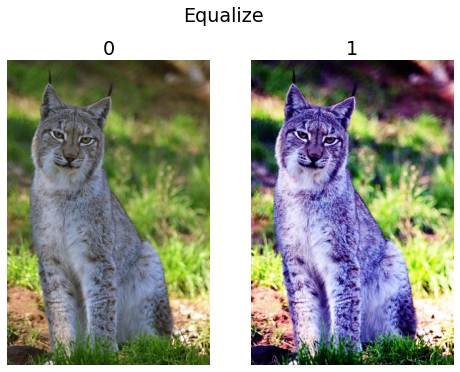

In [25]:
lEqualize = [oImage] + [transforms.RandomEqualize(p=1)(oImage)]
PlotTransofrm(lEqualize, 'Equalize')

#### Random horizontal flip
The `RandomHorizontalFlip` transform performs horizontal flip of an image, with a given probability.

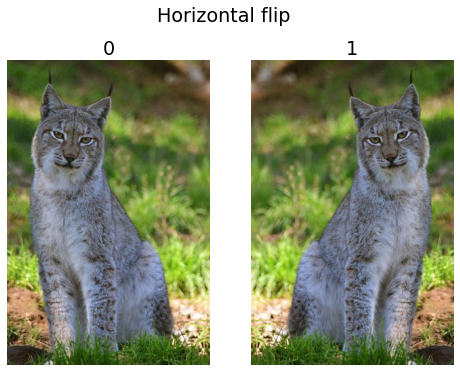

In [26]:
lHflip = [oImage] + [transforms.RandomHorizontalFlip(p=1)(oImage)]
PlotTransofrm(lHflip, 'Horizontal flip')

#### Random vertical flip
The `RandomVerticalFlip` transform performs vertical flip of an image, with a given probability.

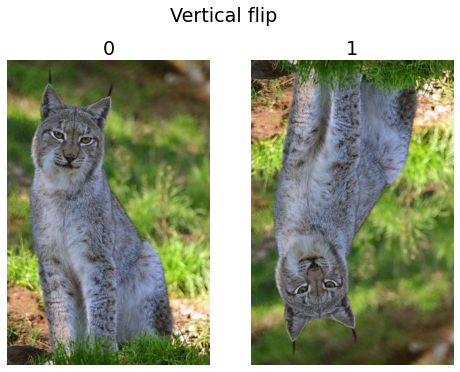

In [27]:
lVflip = [oImage] + [transforms.RandomVerticalFlip(p=1)(oImage)]
PlotTransofrm(lVflip, 'Vertical flip')

#### Auto-augment
The `AutoAugment` transform automatically augments data based on a given auto-augmentation policy.  
See `AutoAugmentPolicy` for the available policies.

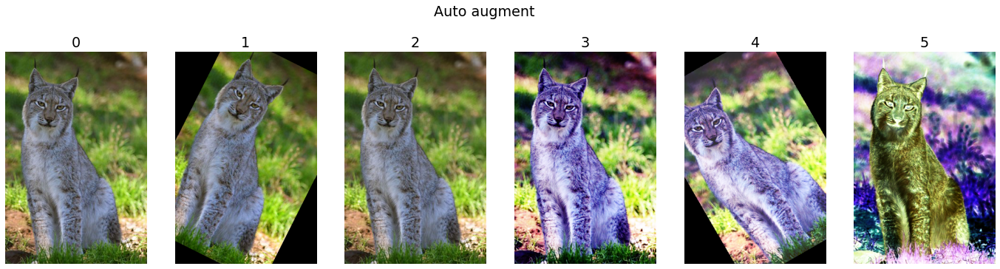

In [28]:
oAuto = transforms.AutoAugment(policy=transforms.AutoAugmentPolicy.IMAGENET)
lAuto = [oImage] + [oAuto(oImage) for _ in range(5)]
PlotTransofrm(lAuto, 'Auto augment')

In [29]:
oImage.close()